# Daten Importieren

> Disclaimer: wie in der ersten Übung beschrieben, orientiert sich dieses Notebook einer [Einführung in R](https://xvariable.github.io/r_book/intro.html) von Julia Niemann-Lenz sowie dem Buch [R for Data Science](https://r4ds.hadley.nz/) von Hadley Wickham, Mine Çetinkaya-Rundel und Garrett Grolemund. R4DS ist lizenziert unter der [CC BY-NC-ND 3.0 License](https://creativecommons.org/licenses/by-nc-nd/3.0/us/). (*Wickham, H., Çetinkaya-Rundel, M., & Grolemund, G. (2023). R for data science. " O'Reilly Media, Inc.". [Online-Präsenz](https://r4ds.hadley.nz/))*. Die Aufgaben 1-4 in diesem Notebook kommen aus R4DS.

In [ ]:
# wir benutzen wieder pacman, um die notwendigen Pakete zu laden
# install.packages("pacman")
pacman::p_load(
    tidyverse, 
    janitor,   # enthält einige nützliche Funktionen, z.B. zum Umbennenen von Vaiablen
    lubridate, # Tidyverse-Paket für die Arbeit mit Datum & Uhrzeit
    sf         # für die Arbeit mit Geodaten
    ) 

# Set the default plot width for Jupyter Notebook display
options(repr.plot.width = 12, repr.plot.height = 12)

## Einführung: Dateitypen & Dateiformate

<img src="https://readr.tidyverse.org/logo.png" alt="Logo von readr" width="100" align=right /> Bisher haben wir ausschließlich mit Datensätzen gearbeitet, die wir direkt als Paket geladen haben. Diese Datensätze sind vor allem für didaktische Zwecke gedacht. In der Realität wirst du eher mit Daten arbeiten, die du selbst erhoben hast oder die Datensätze anderer nutzen. Diese stehen im seltensten Fall als Paket bereit. Meistens liegen sie in einer anderen Form vor und manchmal müssen sie erst zusammengebaut oder aufgeräumt werden, bevor man sie sinnvoll verwenden kann.

In dieser sowie der übernächsten Sitzung (also in 4 & 6) werden wir uns mit anderen Datenquellen beschäftigen. Datensätze können z. B. als lokale .csv- oder Excel-Dateien vorliegen, aber auch in SQL-Datenbanken gespeichert sein oder über Schnittstellen abgerufen werden. SQL ist eine weitere Programmiersprache und diese Schnittstellen werden in der Regel als APIs (Application Programming Interface) bezeichnet. Doch dazu später mehr.

Einen kleinen Überblick über mögliche Datenquellen gibt diese (unvollständige) Liste:
- **R-Pakete**: diese Art von Daten kennen wir schon (z. B. das Paket [`palmerpenguins`](https://allisonhorst.github.io/palmerpenguins/) oder [`nycflights13`](https://www.rdocumentation.org/packages/nycflights13/versions/1.0.1)). In diesem Fall ist das Laden besonders einfach, weil wir den bereits verwendeten Befehl `library(palmerpenguins)` nutzen können.
- **Lokale Dateien**: wir können Datensätze als lokale Dateien vorliegen haben, z. B. als .xlsx- oder .csv-Datei. Das wäre zum Beispiel der Fall, wenn wir eine Umfrage durchgeführt haben und die erhobenen Umfragedaten als .csv-Datei aus dem Umfragetool (z. B. limesurvey) exportiert haben. Vielleicht haben wir die Excel-Datei aber auch selbst erstellt (z. B. wenn wir die Kursnamen der Studis aus Stine nochmal auflisten wollen). Neben bekannteren Formaten wie xlsx oder csv gibt es auch andere Formate, wie z.B. json oder geojson (für Geodaten).
- **URLs (Webseiten)**: analog zu lokalen Dateien gibt es auch öffentlich zugänglich Server, von denen wir direkt .csv-Dateien laden können. Solche Server heißen auch "Datenrepositories".
- **SQL**: SQL ist eine Programmiersprache, mit der SQL-Datenbanken angesprochen werden können. SQL ist weit verbreitet und viele Datenbanken basieren darauf. SQL wird auch in der Vorlesung Datenwelten thematisiert.
- **APIs**: APIs sind vor allem später in der Forschung relevant. Viele Organisationen, die mit Daten arbeiten haben eine eigene API, die z.B. festlegt, mit welchen Befehlen auf welche Daten zugegriffen werden kann. Z.B. stellt Spotify eine API zur Verfügung, mit derer User:innen Zugriff auf Informationen zu allen Tracks und Artists, die von Spotify gehostet werden, haben. APIs ermöglichen es uns, direkt mit R auf die dahinterliegenden Datenbanken zuzugreifen, ohne dafür die Datenbankinfrastruktur zu verstehen oder eine neue Programmiersprache zu lernen. Als Schnittstelle sind sie dadurch für uns besonders nützlich!

In dieser Übung werden wir uns erstmal damit beschäftigen, wie wir .csv-Dateien in R laden sowie anschließend verarbeiten und aufbereiten können.

Viele von euch werden das Dateiformat `.xlsx` bereits kennen, welches Excel-Dateien beschreibt. Ein anderes weit verbreitetes Dateiformat für Datensätze ist das [`.csv`](https://de.wikipedia.org/wiki/CSV_(Dateiformat))-Format (*comma separated values*). Die Formate `.xlsx` und `.csv` sind besonders üblich zur Datenspeicherung. Sie können mithilfe von Funktionen aus dem Paket [`readr`](https://readr.tidyverse.org/) gelesen werden, welches im [`tidyverse`](https://www.tidyverse.org/) enthalten ist. 

> Eine `.csv`-Datei ist eigentlich bloß eine Textdatei. Sie ist so aufgebaut, dass jede Zeile einen "Fall" enhält (entspricht also einer Datensatz-Zeile). Die einzelnen Werte in den Zeilen sind durch ein Komma voneinander abgetrennt (Wert,Wert,Wert). Die erste Zeile enthält üblicherweise die Bezeichnungen der Variablen, welche ebenfalls durch Kommas voneinander getrennt werden. Ein Komma ist in vor allem in englisch-sprachigen Daten ein nützlicher Trenner. In deutschen Daten wird das Komma als Trenner manchmal vermieden, weil wir es auch als Dezimaltrenner für Kommazahlen einsetzen und es dann leicht zu Fehlern bei der Interpretation der `.csv`-Daten kommt. In deutschsprachigen Dateien wir deshalb auch oft ein Semikolon `;` als Seperator verwendet.

<img src="https://haven.tidyverse.org/logo.png" alt="Logo von readr" width="100" align=right /> Andere bekannte Formate sind außerdem das Dateiformat `.sav` aus dem Programm SPSS oder `.dta` aus dem Programm Stata. Für den Import von SPSS- und Stata-Daten gibt es das Paket [`haven`](https://haven.tidyverse.org/), welches ebenfalls in [`tidyverse`](https://www.tidyverse.org/) integriert ist.

Natürlich gibt es auch noch andere Dateiformate. Darauf werden wir hier aber erstmal nicht weiter eingehen.

In dieser Übung werden wir erstmal beispielhaft eine csv-Datei einlesen und verschiedene Aspekte des Einleseprozesses kennenlernen. Anschließend folgt ein anwendungsbezogeneres Beispiel, bei dem zunächst Strompreisdaten und dann dazugehörige Geodaten eingelesen und anschließend kombiniert und visualisiert werden. Falls die Übung diese Woche zu kompliziert oder zu lang ist, arbeitet einfach so weit ihr kommt. Idealerweise könnt ihr den Rest dann noch zuhause bearbeiten, oder zumindest einmal überfliegen (und z.B. nur die vorgegebenen Code-Zellen ausführen), um einen Überblick zu bekommen.

## Daten lesen

<div align="center">
    <a href="https://szene-hamburg.com/wp-content/uploads/2023/09/107001/85799-1320x880.jpeg">
        <img src="https://szene-hamburg.com/wp-content/uploads/2023/09/107001/85799-1320x880.jpeg" width="30%">
    </a>
    <i>
        Reeperbahn Festival 2023 – Bildquelle: <a href="https://szene-hamburg.com/reeperbahn-festival-2023/">Szene Hamburg</a>
    </i>
</div>




Als erstes lernen wir die Funktion [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) aus dem Paket [`readr`](https://readr.tidyverse.org/) kennen. Die Datei `data/booking.csv` enthält einige Artists, die auf dem Reeperbahn Festival aufgetreten sind. Allerdings liegen die Daten nicht alle im gleichen Format vor. Es fehlt z. B. ein Wert, die Rechtschreibung ist nicht einheitlich, genauso wenig wie die Uhrzeiten:

| Artist ID | Artist Name    | Time of Day | Week Day  | Stage           |
|-----------|----------------|-------------|-----------|-----------------|
| 1         | Wa22ermann      | 21:20       | Samstag   | Moondoo         |
| 2         | team scheisse  | 10 nach 11  |  `NA`  | uebel&gefährlich|
| 3         | Apsilon        | 23 Uhr 40   | Samstag   | Mojo Club       |
| 4         | Altin Gün      | 23:45       | Samstag   | Elbphilharmonie  |
| 5         | Carlo Karacho  | 19:30       | Freitag   | Festival Village|
| 6         | 3LNA           | 21:20       | Freitag   | ?               |
| 7         | Fuffifufzich   | 21:30       | Freitag   | uebel&gefährlich|

In den nächsten Schritten werden wir den Datensatz mit [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) einlesen und dann aufräumen, sodass eine weitere Verarbeitung des Datensatzes möglich wird. [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) nimmt dabei als erstes Argument den Dateipfad, unter dem die Datei liegt, in unserem Fall `data/booking.csv`. Das Konzept von Dateipfaden kennt ihr vielleicht schon von eurem eigenen Computer. Ein Dateipfad ist quasi die Adresse der Datei und existiert natürlich auch auf dem Server, auf dem die Jupyter Notebooks laufen. 

In [ ]:
booking <- read_csv("data/booking.csv")

Wir haben die Datei jetzt in das Objket `booking` eingelesen. [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) spuckt uns dabei noch einige Informationen über die eingelesenen Daten aus. Z. B. wird das Komma `,` als sogenannter delimiter benutzt. Das entspricht unserer Erwartung bei einer .csv-Datei (*comma separated values*). Außerdem versucht [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) auch, den Spalten direkt die richtigen Datentypen zuzuordnen. Falls es diese nicht erkennt, wird als default-Wert von einem `character` ausgegangen. 

## Praktische Tipps

Wie wir in der Tabelle oben sehen können, liegen leider nicht alle Fälle einer Variable im gleichen Format vor. Beispielsweise in der `Time of Day`-Spalte, wo verschiedene Formate zur Uhrzeit vorliegen. Daher folgen jetzt einige Schritte, mit denen wir [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) direkte Anweisungen geben, wie die Daten einheitlich eingelesen werden können.

In der Spalte `stage` ist in einer Zeile keine Bühne angegeben. Dafür wurde der fehlende Wert in der Spalte `week.day` bereits richtig als `NA` erkannt. Um das Fragezeichen ebenfalls direkt als `NA` einzulesen, können wir [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) dafür das Argument `na` übergeben:

In [ ]:
booking <- read_csv("data/booking.csv", # Dateipfad angeben
                   na = c("?", "") # welche Werte sollen als NA eingelesen werden?
                   ) %>%
    print() # Ergebnisse mit der Pipe und print() ausgeben

### Variablen umbenennen

Außerdem fällt auf, dass in den ersten drei Spalten die Bezeichnungen mit Backticks (rückwärts geneigte einfache Anführungszeichen) umgeben sind. Das liegt daran, dass die Bezeichnungen nicht dem von R geforderten Schema entsprechen. Sie enthalten nämlich Leerzeichenund sind deshalb **non-syntactic**.

> Wir erinnern uns, dass die Bezeichnung von Variablen nach Tidyverse-Standard nach dem *lower_snake_case* Schema passiert!

Wir können jetzt die Pipe und die Funktion [`rename()`](https://dplyr.tidyverse.org/reference/rename.html) aus dem [`dplyr`](https://dplyr.tidyverse.org/)-Paket benutzen, um diese Spalten umzubenennen. Außerdem fügen wir der [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html)-Funktion noch das Argument `show_col_types = FALSE` hinzu, damit die rote Warnung nicht mehr ausgegeben wird:

In [ ]:
booking <- read_csv("data/booking.csv", # Dateipfad angeben
                    na = c("?", ""), # welche Werte sollen als NA eingelesen werden?
                    show_col_types = FALSE # Warnung nicht ausgeben
                   ) %>%
    rename(artist_id = `Artist ID`, # Spalten umbenennen nach dem Schema neuer_name = alter_name
           artist_name = `Artist Name`,
           time_of_day = `Time of Day`,
           week_day = week.day) %>%
    print() # Ergebnisse mit der Pipe und print() ausgeben

### Das Paket [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0)

<img src="https://sfirke.github.io/janitor/reference/figures/logo_small.png" width="100" align=right />

Eine andere Möglichkeit bietet das Paket [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0), welches viele praktische Funktionen zur Datenbereinigung beinhaltet. Es gibt bspw. die Funktion `janitor::clean_names()`, die diese Umbenennung ziemlich gut automatisch hinbekommt:

In [ ]:
booking <- read_csv("data/booking.csv", # Dateipfad angeben
                    na = c("?", ""), # welche Werte sollen als NA eingelesen werden?
                    show_col_types = FALSE # Warnung nicht ausgeben
                   ) %>%
    janitor::clean_names() %>% # Spalten umbenennen
    print() # Ergebnisse mit der Pipe und print() ausgeben

Die Variable `stage` ist streng genommen eine kategoriale/nominiale Variable, weil sie nur eine begrenzte Anzahl an Möglichkeiten annehmen kann (das Reeperbahn-Festival hat auch nur eine begrenzte Anzahl an Bühnen). Dieser Datentyp wird in R `factor` genannt. Wir können mithilfe von [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html) den Datentyp der Spalte `stage` ändern.

In [ ]:
booking %>%
    mutate(stage = factor(stage)) %>%
    print() # Ergebnisse mit der Pipe und print() ausgeben

Wir können sehen, dass die Werte der Spalte `stage` gleichen geblieben sind. Lediglich der Datentyp der Spalte hat sich von `<chr>` zu `<fct>` geändert. `factor` wird uns als kategorischer Datentyp später immer wieder begegnen. 

> Man kann die Werte von Faktoren auch nach selbst festgelegten Kritieren ordnen (z.B. Bühnen nach Größe des Publikumsraums). Das ist nützlich, wenn man eine Variable mit *ordinalem Datenniveau* festlegen möchte. Im aktuellen Beispiel, lassen wir das aber erstmal weg.

### Unsaubere Werte aufräumen

In unserem Datensatz gibt es jetzt noch eine unsaubere Spalte, und zwar die Spalte `time_of_day`. Hier können wir wieder [`mutate()`](https://dplyr.tidyverse.org/reference/mutate.html) benutzen, um den String `23 Uhr 40` in `23:40` umzuwandeln. Wir werden auf den Code nicht weiter im Detail eingehen, es sollen nur die Möglichkeiten der Datenbereinigung gezeigt werden:

In [ ]:
booking %>%
    mutate(stage = factor(stage)) %>%
    mutate(time_of_day = str_replace(time_of_day, " Uhr ", ":")) %>%
    print()

<img src="https://stringr.tidyverse.org/logo.png" alt="Logo von stringr" width="100" align=right /> An dieser Stelle haben wir die Funktion [`str_replace()`](https://stringr.tidyverse.org/reference/str_replace.html) aus dem Paket [`stringr`](https://stringr.tidyverse.org/index.html) benutzt, welches viele nützliche Funktionen für die Manipulation von Text (Strings) beinhaltet.

Die Uhrzeit in der Spalte `time_of_day` ist jetzt einheitlich!

## Weitere Argumente

[`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) kennt auch noch weitere Argumente, die hier kurz noch erläutert werden sollen. Dafür benutzen wir einen kleinen Trick: [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) kann nämlich auch Text einlesen, der wie eine .csv-Datei formatiert ist:

In [ ]:
read_csv(
    "a,b,c
    1,2,3
    4,5,6",
    show_col_types = FALSE # wir unterdrücken wieder die Warnung
)

Normalerweise fängt [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) immer bei der ersten Zeile an. Es kann aber manchmal vorkommen, dass .csv-Dateien in den ersten Zeilen einige Infos zum Datensatz oder zur Erhebung der Daten o. ä. stehen haben, sogenannte Metadaten. Dafür können wir die praktischen Argumente `skip = n` oder `comment = "#"` benutzen:

In [ ]:
read_csv(
    "Diese Daten wurden per Hand erzeugt
    am 13.09.2023
    x,y,z
    1,2,3
    4,5,6",
    skip = 2, # wir überspringen die ersten 2 Zeilen
    show_col_types = FALSE # wir unterdrücken wieder die Warnung
)

Genauso können wir auch angeben, dass alle Zeilen ausgespart werden sollen, die mit einem bestimmten Zeichen beginnen:

In [ ]:
read_csv(
    "# A comment I want to skip
    x,y,z
    1,2,3",
    comment = "#", # spare alle Zeilen aus, die mit einem # beginnen
    show_col_types = FALSE # wir unterdrücken wieder die Warnung
)

Ebenfalls praktisch ist es, [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) direkt die richtigen Bezeichnungen für die eingelesenen Spalten zu übergeben. Das passiert mithilfe des Arguments `col_names`:

In [ ]:
read_csv(
    "1,2,3
    4,5,6",
    col_names = c("x", "y", "z"), # Spaltennamen angeben
    show_col_types = FALSE # wir unterdrücken wieder die Warnung
)

## Andere Dateiformate lesen

Sobald Du einmal [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) verstanden hast, sind die anderen Funktionen von [`readr`](https://readr.tidyverse.org/) und [`haven`](https://haven.tidyverse.org/) einfach zu benutzen, da sie dem gleichen Schema folgen. 

Ein kleiner Überblick über die Funktionen, mit denen man weitere Dateiformate einlesen könnte:
* [`read_excel()`](https://readxl.tidyverse.org/reference/read_excel.html) aus dem Paket [`readxl`](https://readxl.tidyverse.org/) liest Excel-Dateien
* [`read_csv2()`](https://readr.tidyverse.org/reference/read_delim.html) liest Dateien, die mit einem Semikolon getrennt sind (also mit `;` als Separator statt `,`. Diese sind z. B. im deutschsprachigen Raum weitverbreitet, weil hier das Komma oft als Dezimaltrenner genutzt wird
* [`read_tsv()`](https://readr.tidyverse.org/reference/read_delim.html) liest Dateien, die mit einem `tab` getrennt sind
* [`read_delim()`](https://readr.tidyverse.org/reference/read_delim.html) versucht den Separator automatisch zu ermitteln, kann also auf viele Formate angewendet werden  
* [`read_fwf()`](https://readr.tidyverse.org/reference/read_fwf.html) liest *fixed-width files*, also Dateien, bei denen die Werte durch eine feste Zeichenanzahl definiert sind.
* [`read_dta()`](https://haven.tidyverse.org/reference/read_dta.html) liest Stata-Dateien  
* [`read_sav()`](https://haven.tidyverse.org/reference/read_spss.html) liest SPSS-Dateien

> Es ist übrigens auch möglich, Dateien direkt aus dem Internet zu lesen: das geschieht mithilfe von `read_csv(url)` – man gibt also einfach eine URL statt eines Dateipfades an. Im Folgenden wird beispielhaft ein [Datensatz über Autos](https://github.com/tidyverse/readr/blob/main/inst/extdata/mtcars.csv) aus dem 1974 Motor Trend US magazine eingelesen. Dieser stammt aus dem Paket [readr](https://github.com/tidyverse/readr/tree/main):

In [ ]:
read_csv(
    "https://github.com/tidyverse/readr/raw/main/inst/extdata/mtcars.csv", # die URL
    show_col_types = FALSE # Warnung nicht ausgeben
) %>%
    glimpse()

**Fragen:**

1. Welche Funktion würdet ihr benutzen um eine Datei zu lesen, die das Zeichen `|` als Trennzeichen nutzt?

2. Welche Argumente haben [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) und [`read_tsv()`](https://readr.tidyverse.org/reference/read_delim.html) gemeinsam, abgesehen von `file`, `skip` und `comment`? Tipp: Schaut hierfür in die [Dokumentation](https://readr.tidyverse.org/reference/read_delim.html) der beiden Funktionen.

3. Schaut euch den folgenden Code an. Was passiert, wenn ihr den Code ausführt? Überlegt, warum der Code so ausgegeben wird.

In [ ]:
read_csv("a,b\n1,2,3\n4,5,6")
read_csv("a,b,c\n1,2\n1,2,3,4")
read_csv("a,b\n\"1")
read_csv("a,b\n1,2\na,b")
read_csv("a;b\n1;3")

4. Es kann immer wieder vorkommen, dass ihr in Datensätzen Variablen begegnet, die nicht der klassischen R-Syntax entsprechen. Im Folgenden wird ein `tibble` erzeugt, der als Spaltennamen `1` und `2` hat.

In [ ]:
# Mit diesem Code erzeugt ihr den tibble
annoying <- tibble(
  `1` = 1:10,
  `2` = `1` * 2 + rnorm(length(`1`))
)

Versucht die folgenden Befehle zu coden, um den Umgang mit *non-syntactic*  Variablen zu üben:

* Gebt die Spalte der Variable `1` aus.

* Erstellt einen einfach Plot mit [`ggplot2`](https://ggplot2.tidyverse.org/), bei dem `1` auf der x-Achse liegt und `2` auf der y-Achse.

* Fügt dem Datensatz eine neue Spalte `3` hinzu, die mit `2` geteilt durch `1` berechnet wird.

* Nennt die Spalten in `one`, `two` und `three` um.

## Daten manuell bereinigen

Manchmal ist es praktisch, einen Data Frame direkt als Code in R eingeben zu können und anschließend zu speichern. Dafür können z. B. die beiden Funktionen [`tibble()`](https://tibble.tidyverse.org/reference/tibble.html) und [`tribble()`](https://tibble.tidyverse.org/reference/tribble.html) genutzt werden. [`tibble()`](https://tibble.tidyverse.org/reference/tibble.html) kombiniert mehrere Spalten zu einem Data Frame:

In [ ]:
data = tibble(
  x = c(1, 2, 5),
  y = c("h", "m", "g"),
  z = c(0.08, 0.83, 0.60)
) %>% print()

[`tribble()`](https://tibble.tidyverse.org/reference/tribble.html) funktioniert analog, kombiniert allerdings die Reihen eines Data Frames (daher die Abkürzung ***tr**ansposed **tibble***:

In [ ]:
tribble(
  ~x, ~y, ~z,
  1, "h", 0.08,
  2, "m", 0.83,
  5, "g", 0.60
) %>% print()

Wir können jetzt auf einzelne Elemente zugreifen. Dafür benutzen wir in R eckige Klammern `[[i, j]]`, um auf Zeile `i` und Spalte `j` zuzugreifen:

In [ ]:
data[[1, 2]] # gibt die 1. Zeile und 2. Spalte zurück

Wir können das Element damit aber auch verändern:

In [ ]:
data[[1, 2]] = "NEU"
data %>% print()

Neben `[[]]` kann man auch mit `[]` auf einzelne Elemente eines Data Frames zugreifen.

* Wenn man `[]` auf Listen oder Data Frames anwendet, gibt dies immer ein Objekt derselben Struktur zurück. Wenn du beispielsweise einen Vektor aus einem Datensatz mit `[]` extrahierst, erhältst du einen Data Frame mit einer Spalte. Bei einer Liste erhältst du eine Unterliste usw. Es können auch mehrere Elemente ausgegeben werden. Dafür muss die Range mithilfe von `x:y` angegeben werden, sodass dann alle Werte zwischen `x` und `y` ausgegeben werden. Ähnlich kann man mithilfe von `-` auch bestimmte Werte ausschließen:

In [ ]:
data[1, 1:3] # gibt alles zwischen Spalte 1 und 3 aus
data[1, -1] # schließt Spalte 1 aus

* Wenn man mit `[[]]` arbeitet, wird immer nur ein einzelnes Element ausgegeben. Es ist dann nicht möglich, mehrere Elemente auszugeben.

*Subsetting* mit `[]` oder `[[]]` funktioniert auf gewisse Weise ähnlich wie mithilfe von `$`. Damit haben wir ja auch schon die Möglichkeit kennengelernt, nur eine Teilmenge des Dataframes zurückzugeben, z. B. mit `data$x`, welches die Spalte `x` ausgibt. Mithilfe der eckigen Klammern gibt es nun die Möglichkeit, Datensätze auch direkt manuell und nicht nur spaltenweise zu manipulieren. Solche Manipulationen sind natürlich sehr fehleranfällig. Deshalb ist es sinnvoll, sie gut zu dokumentieren und auf keinen Fall die Rohdaten dauerhaft zu überspeichern.

<div style="background-color: #efe3fd"><h1>Präsenzteil: Mehrere Datensätze kombinieren</h1></div> 

> Der Präsenzteil dieses Notebooks ist vermutlich zu lang für die Übungszeit in Präsenz. Arbeitet einfach so weit wie ihr kommt. Der Rest ist optional und kann gerne zuhause noch weiter bearbeitet werden, wenn ihr interessiert seid und noch etwas Lust zu tüfteln habt!

<div align="center">
    <a href="https://upload.wikimedia.org/wikipedia/commons/thumb/2/29/European-union-renewables-new.svg/2501px-European-union-renewables-new.svg.png">
        <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/2/29/European-union-renewables-new.svg/2501px-European-union-renewables-new.svg.png" width="50%">
    </a>
</div>

Anteil der erneuerbaren Energien in Europa am Bruttoendenergieverbrauch im Jahr 2019. Bildquelle: [Wikipedia](https://en.m.wikipedia.org/wiki/File:European-union-renewables-new.svg)


Es kann auch vorkommen, dass aufgrund der Größe von Datensätzen oder wegen der Übersichtlichkeit Daten in mehreren Dateien abgespeichert werden. Ein Beispiel hierfür befindet sich im Verzeichnis `data/entsoe/dayahead_euro/`. Hier liegen mehrere csv-Dateien aus verschiedenen Jahren, welche die Strompreisdaten des Dayahead-Marktes beinhalten.

> Die Dayahead-Auktion auf den europäischen Strommärkten ermöglich Stromanbietern, kurzfristig (1 Tag vorher, daher Dayahead) Strom nachzukaufen oder zu verkaufen. Ein Beispiel wäre ein Solarpark, der aufgrund der Wetterprognose (morgen keine Sonne) kalkuliert, dass Strom nachgekauft werden muss, um trotzdem das Angebot für die Endverbraucher:innen zu erfüllen. Die größten Mengen auf den Strommärkten werden i.d.R. im Termingeschäft gehandelt, also meistens schon Jahre vorher. Ca. 10-15% der Strommengen muss dann aber noch auf kurzfristigen Märkten gehandelt werden, sodass der Dayahead-Markt eine starke Steuerungsfunktion für die Strompreise hat. Die Energiekrise von 2021/2022 werden wir z.B. gleich sehr gut in den Daten sehen können.

Die Daten kommen von der [ENTSOE-E](https://www.entsoe.eu/), der *European association for the cooperation of transmission system operators for electricity*. Nach europäischer Gesetzgebung muss die ENTSOE-E eine Schnittstelle bereitstellen, über die energiewirtschaftliche Daten in der EU abgefragt werden können (z.B. Preisdaten, aber auch Energieerzeugungs- oder -verbrauchsdaten). Nach den [Terms and Conditions](https://transparency.entsoe.eu/content/static_content/Static%20content/terms%20and%20conditions/terms%20and%20conditions.html) der ENTSOE-E sind die Preisdaten unter der *CC-BY 4.0* Lizenz frei verfügbar.

Die .csv-Dateien in unserem Verzeichnis sind bereits über die Schnittstelle (API) abgerufen worden. Anschließend wurden die Daten mit Wechselkursen von https://www.exchange-rates.org/ in Euro umgewandelt und gespeichert. 

Wir wollen die Daten mit Geodaten von den sogenannten Bidding Zones verbinden. Die stammen aus dem [Github-Repository](https://github.com/EnergieID/entsoe-py/tree/master/entsoe/geo) des Python-Wrappers [entsoe-py](https://github.com/EnergieID/entsoe-py/tree/master) für die ENTSOE-API. Diese sind über eine [MIT Licence](https://github.com/EnergieID/entsoe-py?tab=MIT-1-ov-file#readme) ebenfalls frei verfügbar. Die Geodaten liegen im Verzeichnis `data/entsoe/bidding_zones_geojson/`.

> Die Bidding Zones sind Zonen, in denen ein einheitlicher Strompreis gilt. In den meisten europäischen Staaten entsprechen sie den Staatsgrenzen. Manche Staaten haben jedoch auch mehrere Bidding Zones.

In den folgenden Schritten sollt ihr alle Dateien...

* importieren (Import)
* bereinigen (Tidy)
* aufbereiten (Transform)
* und  visualisieren (Explore/Visualise)

## Dayahead-Preisdaten importieren

Als erstes müssen wir die Dayahead-Preisdaten laden. Diese sollen im Verzeichnis `data/entsoe/dayahead_euro/` liegen. Wechselt im *File Browser* links dafür in das entsprechende Verzeichnis. Dort seht ihr eine ganze Menge an csv-Dateien. Mit Doppelklick könnt ihr eine der Dateien öffnen und inspizieren.

**Frage:**

5. Diskutiert zu zweit, in welchem Format die Daten vorliegen. Welche Bedeutung haben Spalten und Reihen?

Hmmm, wie können wir jetzt alle diese Dateien möglichst einfach laden? Als erstes müssen wir dem Computer eine Liste mit den Dateinamen übergeben, damit dieser weiß, welche Dateien alles eingelesen werden sollen. Dafür benutzen wir den Befehl `list.files()`. Außerdem wollen wir nur Dateinamen in die Liste schreiben, welche mit `.csv` enden:

In [ ]:
dayahead_files <- "data/entsoe/dayahead_euro/" %>%
    list.files(
        full.names = TRUE,  # damit R die richtigen Dateien findet, müssen vollen Dateinamen inkl. Dateipfad zurückgegeben werden
        pattern = "\\.csv$" # uns interessieren nur csv-Dateien
    )

print(dayahead_files)

Super, jetzt weiß der Computer schon mal, welche Dateien wir einlesen wollen. Wir benutzen dafür die oben erwähnte Funktion `read_csv()`. Diese wollen wir jetzt auf jedes Element in unserer Dateiliste `dayahead_files` anwenden. Dafür können wir die Funktion `map()` benutzen.

> `map()` ist eine Funktion aus dem Tidyverse-Paket `purrr`, die dazu dient, eine Funktion auf jedes Element einer Liste, eines Vektors oder Dataframes anzuwenden. Stell dir vor, du hast eine Box mit verschiedenen Objekten und du möchtest mit jedem Objekt in dieser Box etwas Bestimmtes machen. `map()` hilft dir dabei. Du gibst `map()` die Box und sagst ihr, welche Aktion du mit jedem Objekt machen möchtest. Am Ende gibt dir `map()` eine neue Box mit den veränderten Objekten zurück.

Anschließend müssen wir die Objekte, die wir mit `map()` und `read_csv()` eingelesen haben, miteinander verbinden. Dafür hat das `tidyverse` die Funktion `bind_rows()`. Damit können wir mehrere Dataframes **reihenweise** miteinander verbinden und in einem gemeinsamen Dataframe speichern. In Kombination sieht das ganze dann folgendermaßen aus:

In [ ]:
dayahead_raw <- dayahead_files %>% 
    map(~read_csv(.x, show_col_types = FALSE)) %>% # mit dem Argument show_col_names = FALSE vermeiden wir uninteressanten Output beim Laden der csv-Dateien
    bind_rows() # und mit bind_rows() werden die einzelnen eingelesen Datensätze dann reihenweise "zusammengeklebt"

dayahead_raw %>% head(3) # mit head() können wir uns das Ergebnis anschauen

Also, nochmal zusammengefasst – was haben wir eigentlich gemacht?

* Als erstes haben wir mit `list.files()` eine Liste mit allen Dateien in dem Preisdaten-Verzeichnis erstellt.
* Dann haben wir mithilfe von `map()` den Befehl `read_csv()` auf alle diese Dateien angewendet um so jede einzelne Datei einzulesen. Das hätte für andere Dateiformate auch z.B. mit `read_excel()` funktioniert.
* Anschließend können wir die einzelnen eingelesenen Ergebnisse verbinden. Dafür benutzen wir `bind_rows()`.

**Frage:**

6. Welche Spalten hat der geladene Datensatz und was könnten sie bedeuten?
7. In der Spalte `index` ist das Datum gespeichert. Wie könnt ihr den Zeitraum herausfinden, indem die Daten vorliegen?

Der Übersichtlichkeit und Vollständigkeit halber können wir `index` mit `rename()` in `date` umbenennen. Und wir filtern noch auf den Zeitraum 2018-2023:

In [ ]:
dayahead_wide <- dayahead_raw %>%
    rename(date = index) %>%
    filter(year(date) >= 2018 & year(date) <= 2023)

dayahead_wide %>% head(3)

Jetzt haben wir einen einzigen Datensatz, mit dem wir weiterarbeiten können. Im Prinzip haben wir hier in kleiner Form schon die Schritte *Import*, *Tidy* und *Transform* durchlaufen.

Könnt ihr schon erkennen, was für Daten wir vorliegen haben? Momentan repräsentiert jede Zeile eine Stunde, die in der gerade umbenannten Spalte `date` abgebildet wird. Jede weitere Spalte repräsentiert eine Bidding Zone – diese wird durch ihre Abkürzung gekennzeichnet. Jede Zeile stellt eine Beobachtung dar - also den Preis in der jeweiligen Bidding Zone zur jeweiligen Uhrzeit.

Um die Preisdaten einfacher visualisieren zu können, müssen wir deren Format verändern. Unser Ziel ist ein Datensatz, welcher nur aus drei Spalten besteht, und zwar aus der Spalte `date`, der Spalte `bz` mit den Bidding Zones, und der Spalte `price` mit den Preisdaten. Dafür müssen wir die Daten pivotieren. Momentan liegen unsere Daten im sogenannten Wide-Format vor, und unser Ziel ist eine Darstellung im Long-Format. Dieser Unterschied ist u.a. genauer beschrieben im Kapitel [Pivoting](https://r4ds.hadley.nz/data-tidy#sec-pivoting) in R4DS. Falls ihr tiefer einsteigen wollt, lest euch gerne das verlinkte Kapitel dazu durch.

Ansonsten reicht es zu wissen, dass wir dafür die praktische Funktion `pivot_longer()` verwenden können. Der folgende Code pivotiert die Dayahead-Daten von einem Wide-Format in ein Long-Format.

* Die Spalte `date` wird mithilfe von `!date` fixiert.
* Die Spaltennamen werden mit `names_to` in die neue Spalte `"bz"` transformiert.
* Die Preise werden mit `values_to` in die neue Spalte `"price"` transformiert.
* Anschließend benutzen wir noch `drop_na()`, um fehlende Werte (gekennzeichnet durch `NA`) zu entfernen.

`pivot_longer()` schiebt dann alle Zellen in die zwei neuen Spalten `bz` und `price`. Das wird deutlicher wenn ihr euch gleich den Output des Codes anschaut.

In [ ]:
dayahead_long <- dayahead_wide %>%
    pivot_longer(           # beim Pivotieren...
        !date,              # bleibt die Spalte date fixiert - das symbolisieren wir über das Ausrufezeichen
        names_to = "bz",    # die ursprünglichen Spaltennamen werden in die Spalte "bz" für bidding zone sortiert...
        values_to = "price" # ... und die Werte werden in die Spalte "price" sortiert
    ) %>%
    mutate(bz = as.factor(bz)) %>%
    drop_na()

Wie sieht das ganze aus?

In [ ]:
dayahead_long %>% head(10)

**Frage:**

8. Diskutiert zu zweit, inwiefern ihr gerade die Preisdaten transformiert habt. Ist klar geworden, wie das Pivotieren funktioniert?

## Dayahead-Preisdaten aggregieren

Die Preisdaten liegen in stündlichen Schritten vor. Das ist sozusagen die feinste Granularität. Für einen Überblick ist es manchmal besser, aggregierte Daten zu benutzen. Z.B. können wir monatliche oder jährliche Durchschnittswerte bilden, um einen ersten groben Überblick über den Verlauf der Preisdaten zwischen 2018 und 2023 bekommen.

Für das Aggregieren oder Zusammenfassen von Daten können wir die beiden Funktionen `group_by()` und `summarise()` aus dem Paket `dplyr` benutzen. Diese haben wir schon letzte Woche kennengelernt. Mit `group_by()` erzeugen wir Gruppen innerhalb des Datensatzes, die wir dann mit `summarise()` zusammenfassen können. Wir können z.B. monatliche Durchschnittswerte mit dem Durchschnittsfunktion `mean()` bilden:

In [ ]:
dayahead_aggregated_monthly <- dayahead_long %>%
  mutate(date = floor_date(date, "month")) %>%  # mit floor_date() wird jedes Datum auf den 1. des jeweiligen Monates gesetzt
  group_by(date, bz) %>%
  summarise(
      price = mean(price, na.rm = TRUE), # damit wir keine Fehlermeldung erhalten, entfernen wir mit na.rm = TRUE fehlende Werte...
      .groups = "drop")                  # ... und heben anschließend die Gruppierung auf

dayahead_aggregated_monthly %>% head(10)

## Dayahead-Preisdaten visualisieren

Wie können wir das ganze jetzt grafisch darstellen? 

**Frage:**

9. Überlegt euch kurz, wie ihr die Preisdaten sinnvoll visualisieren würdet? Welcher Parameter liegt auf der x-, welcher auf der y-Achse?

Es folgt ein Beispiel für einen Lineplot, zunächst einmal nur für eine Bidding Zone. Damit können wir den zeitlichen Verlauf des Dayaheadpreises in den letzten 5 Jahren visualisieren.

Wir benutzen wieder das `ggplot2` und zeichen zwei unterschiedliche Linien (die stündlichen und monatlichen Werte):

* Die Datenreihen (= Linien) erzeugen wir mit der Funktion `geom_line()`. Mit `color` und `linewidth` können wir die Linien unterschiedlich darstellen.
* Mit `theme_minimal()` und `labs()` könnt ihr den Plot formatieren.

In [ ]:
ggplot() +
    geom_line(
        data = filter(dayahead_long, bz == "DE_LU"), # filter to the bidding zone DE_LU
        aes(x = date, y = price), 
        color = "blue", linewidth = 0.2
    ) +
    geom_line(
        data = filter(dayahead_aggregated_monthly, bz == "DE_LU"), # filter to the bidding zone DE_LU
        aes(x = date, y = price), 
        color = "red", linewidth = 1.5
    ) +
    theme_minimal(base_size = 10) + # should this size be increased?
    labs(
        title = "What title would you choose?", 
        y = "Price", 
        x = "Date",
        caption = "Enter a caption here"
    )

**Frage:**

10. Wie wurde in dem Code die `filter()`-Funktion verwendet?
11. Überrascht euch das Ergebnis des Plots? Wie würdet ihr den zeitlichen Verlauf bewerten/einschätzen? Habt ihr die Energiekrise 2021/2022 mitverfolgt?
12. Welche weiteren Visualisierungen würden euch interessieren? Könntet ihr diese direkt hier in diesem Notebook umsetzen? Tipp: ihr könntet z.B. das Argument `color` innerhalb von `aes()` nutzen, um mehrere Bidding Zones gleichzeitig zu visualisieren.

In [ ]:
# space for your code here

## Dateien schreiben

<img src="https://readr.tidyverse.org/logo.png" alt="Logo von readr" width="100" align=right /> [`readr`](https://readr.tidyverse.org/) beinhaltet praktischerweise auch Funktionen, mit denen sich ein Datensatz direkt in eine `.csv`-Datei schreiben lässt. Dies ist beispielsweise praktisch, wenn Ergebnisse weitergegeben oder in einem anderen Programm weiterverarbeitet werden sollen. Analog zu [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) gibt es die Funktion [`write_csv()`](https://readr.tidyverse.org/reference/write_delim.html), welche als erste beiden (und wichtigsten) Argumente `x` (den zu speichernden Dataframe) sowie `file` (der Zielort, wo gespeichert werden soll) annimmt. Es gibt auch die Möglichkeit, in bestehende Dateien weitere Zeilen anzuhängen (siehe [Dokumentation von `write_csv()`](https://readr.tidyverse.org/reference/write_delim.html) unter dem Argument `append`).

Wir können beispielhaft die monatlich aggregierten Daten speichern. Dafür schreiben wir den vorher erzeugten Datensatz `dayahead_aggregated_monthly` mit [`write_csv()`](https://readr.tidyverse.org/reference/write_delim.html) in ein `file` in unserem `data`-Verzeichnis.

In [ ]:
write_csv(dayahead_aggregated_monthly, file = "data/dayahead_aggregated_monthly.csv")

**Fragen:**

13. Findet ihr die Datei im File-Browser? Schaut sie euch einmal kurz an, indem ihr sie mit Doppelklick oder Rechtsklick -> Open öffnet.

## Geodaten der Bidding Zones importieren

Wir können die Preisdaten aber auch anders visualisieren, und zwar mithilfe der Geodaten von den einzelnen Bidding Zones. Eine ansprechende Visualisierung könnt eine Karte der europäischen Bidding Zones sein, auf der jede Bidding Zones (im Prinzip also jeder Staat) je nach Preisdurchschnitt eingefärbt ist. Wenn wir es dann noch schaffen, diese Entwicklung bspw. jährlich darzustellen, hätten wir eine informative und ansprechende Grafik.

Als erstes laden wir die Geodaten der Bidding Zones und visualisieren diese. Wechselt im *File Browser* links dafür in das Verzeichnis `data/entsoe/bidding_zones_geojson/`. Dort seht ihr eine ganze Menge an geojson-Dateien. 

> geojson ist ein offenes GIS-Datenformat für Geodaten.

Wenn ihr auf eine der Dateien doppelklickt, könnt ihr sie öffnen und inspizieren. geojson ähnelt dem weitverbreiteten Datenformat json (für JavaScript Object Notation), welches Daten kompakt speichert und so den Austausch zwischen verschiedenen Anwendungen und Programmiersprachen ermöglicht.

Anschließend gehen wir recht analog zu den Preisdaten vor!

* Wir erstellen wieder eine Liste mit den einzulesenden Dateien mithilfe von `list.files()`. Diesmal wollen wir aber nur geojson-Dateien einlesen!
* Anschließend kombinieren wir wieder `map()` und die Einlesefunktion. geojson-Dateien können wir analog zu `read_csv()` mit der Funktion `st_read()` einlesen. Das funktioniert recht ähnlich.
* Die Dateien werden mit `bind_rows()` kombiniert.

Kopiert euch den Code von oben zusammen, um die Geodaten aus dem genannten Verzeichnis einzulesen.

Tipps:
* Bei der Funktion `list.files()` müsst ihr als `pattern` `"\\.geojson$"` angeben, um nur geojson-Dateien einzulesen.
* Bei der Verwendung von `st_read()` kann es hilfreich sein, als Argument `quiet = TRUE` zu übergeben, da sonst bei jeder Datei eine Warnung ausgegeben wird: `map(~st_read(.x, quiet = TRUE))`

In [ ]:
# @Laura: ist das zu kompliziert?

In [ ]:
# Lösung:

geodata <-  "data/entsoe/bidding_zones_geojson/" %>%
    list.files(
        pattern = "\\.geojson$", # read only files that end with .geojson
        full.names = TRUE
    ) %>% 
    map(~st_read(.x, quiet = TRUE)) %>% # mit dem Argument quiet = TRUE vermeiden wir Output beim Laden der Geodaten, der uns erstmal nicht weiter interessiert
    bind_rows()

geodata %>% glimpse() # mit glimpse() können wir uns das Ergebnis wieder anschauen

**Frage:** 

14. Welche Spalten hat der geladene Datensatz und was könnten sie bedeuten?

Also, nochmal zusammengefasst – was haben wir eigentlich gemacht?

* Als erstes haben wir mit `list.files()` eine Liste mit allen Dateien in dem Geodaten-Verzeichnis erstellt.
* Dann haben wir mithilfe von `map()` den Befehl `st_read()` auf alle diese Dateien angewendet um so jede einzelne Datei einzulesen. `st_read()` ist dabei einfach eine spezielle Funktion um geojson-Dateien einzulesen.
* Anschließend können wir die einzelnen eingelesenen Ergebnisse verbinden. Dafür benutzen wir `bind_rows()`.

Der Vollständigkeit halber können wir mit `st_transform()` noch das Koordinatensystem der Geodaten wechseln. Dadurch wird es für `ggplot2` später einfacher, die Geodaten zu visualisieren. Das ist aber eher ein Detailschritt und nicht ganz so wichtig.

In [ ]:
geodata <- geodata %>% st_transform(crs = 3395)

Jetzt haben wir einen einzigen Datensatz, mit dem wir weiterarbeiten können. Hier haben wir wieder in kleiner Form die Schritte *Import*, *Tidy* und *Transform* durchlaufen.

Jetzt zur Visualisierung: wie können wir das ganze darstellen? 

Praktischerweise funktioniert `ggplot()` auch mit `sf` Geodatenobjekten! Wir können dafür einfach ein anderes **geom** benutzen. Für `sf` Objekte benutzen wir das **geom** `geom_sf()`. Ansonsten können wir auch die anderen Funktionen von `ggplot2` benutzen, die wir bereits kennengelernt haben. 

In [ ]:
geodata %>%
    ggplot() +
    geom_sf(aes(geometry = geometry))

Das sieht doch schon mal gut aus!

**Fragen:**

15. Diskutiert zu zweit, was ihr auf der Grafik seht. Könnt ihr die Bidding Zones erkennen?
16. Ohne die Namen der Bidding Zones ist die Grafik nicht so einfach zu lesen. Glücklicherweise gibt es auch dafür eine Funktion und unser Geodatensatz hat ja bereits die passende Spalte `zoneNames` dafür. Mit `geom_sf_label(aes(geometry = geometry, label = zoneName), size = 1)` könnt ihr Label hinzufügen. Für eine etwas schönere Darstellung könnt ihr auch noch `theme_minimal(base_size = 15)` benutzen. Fügt diese beiden Codeschnipsel dem letzten Code hinzu und passt ggf. die Parameter `size` und `base_size` an, um eine lesbare Karte zu erzeugen:

## Beide Datensätze kombinieren...

Jetzt wollen wir beide Datensätze kombinieren. Unser Ziel war ja die jährliche Preisentwicklung in den Bidding Zones darzustellen. Ein einfaches Maß, welches sich gut umsetzen lässt, wäre der jährliche Durchschnittspreis. Weiter oben hatten wir bereits die monatlichen Durchschnittspreise berechnet. Wir können daher den Code von weiter oben nehmen und innerhalb der Funktion `floor_date()` einfach `"month"` mit `"year"` ersetzen.

In [ ]:
dayahead_aggregated_yearly <- dayahead_long %>%
  mutate(date = floor_date(date, "year")) %>%
  group_by(date, bz) %>%
  summarise(price = mean(price, na.rm = TRUE), .groups = "drop")

dayahead_aggregated_yearly %>% head(10)

Wie können wir jetzt beides kombinieren?

Dafür hat das `tidyverse` die sogenannten [join](https://dplyr.tidyverse.org/reference/mutate-joins.html)-Funktionen. Bspw. können wir in diesem Fall `left_join()` verwenden. `left_join()` "klebt" zwei Dataframes aneinander, in diesem Fall die aggregierten Jahresdurchschnittspreise `dayahead_aggregated_yearly` und die Geodaten `geodata`. Mit dem Argument `by` definieren wir, welche Spalten aus den beiden Dataframes R benutzen soll, um die Verbindung zu machen.

In [ ]:
data <- left_join(dayahead_aggregated_yearly, geodata, by = c("bz" = "zoneName"))

Deutlicher wird das Ergebnis, wenn wir es uns ausgeben lassen:

In [ ]:
data %>% head(5)

Im Prinzip hat `left_join()` für jede Zeile innerhalb der Spalte `bz` von `dayahead_aggregated_yearly` geschaut, ob ein Äquivalent in der Spalte `zoneName` von `geodata` vorhanden ist. Falls ja, werden die Spalten von `geodata` einfach hinzugefügt.

Wir haben jetzt beide Datensätze zu einem kombiniert, und können diese endlich visualisieren!

## ... und visualisieren

Wie in den Beispielprojekten aus der 2. Sitzung können wir die Geodaten mit `ggplot2` visualisieren. Hier wird wieder Universalität von `ggplot2` deutlich – wir haben relativ unkompliziert zwei völlig verschiedene Datenformate (geojson und csv) geladen und können jetzt beide mit `ggplot2` visualisieren:

* Zunächst filtern wir unseren Datensatz auf ein Jahr, z.B. 2023
* Mit `ggplot()` erzeugen wir das Diagramm...
* und mit `geom_sf()` können wir Darstellung der Geodaten umsetzen. Dafür müssen wir die `geometry` aus dem Datensatz übergeben. Mit `fill = price` können wir `geom_sf()` sagen, dass die Färbung der geometrischen Objekte durch den Durchschnittspreis kommen soll.

Das ganze sieht dann so aus:

In [ ]:
data %>% 
    filter(year(date) == 2023) %>%
    ggplot() +
    geom_sf(aes(geometry = geometry, fill = price), color = "black")

Das sieht schon mal nicht schlecht aus! Es fehlen aber noch ein paar Sachen, für einen übersichtlicheren Plot:

* Mit `geom_sf_label()` können wir den einzelnen geometrischen Objekten Label zuweisen, die dem Kürzel der Bidding Zone entsprechen (diese liegen in der Spalte `bz`. 
* Mit `scale_fill_viridis_c()` können wir die Färbung und Legende ändern. Hier ist es sinnvoll, kontrastreichere Färbungen zu wählen.
* Mit `theme_minimal()` können wir die allgemeine Darstellung des Plots etwas ändern.

Zusammen sieht das dann so aus:

In [ ]:
data %>% 
    filter(year(date) == 2023) %>%
    ggplot() +
    geom_sf(aes(geometry = geometry, fill = price), color = "black") +
    geom_sf_label(
        aes(geometry = geometry, label = bz), 
        size = 4
    ) +    
    scale_fill_viridis_c(
        option = "C", 
        guide = guide_colourbar(barwidth = 2, barheight = 40)
    ) +
    theme_minimal(base_size = 25)

### `facet_wrap()`

Eine nützliche Funktion von `ggplot2` zur Visualisierung mehrerer Dimensionen innerhalb eines Datensatzes ist [`facet_wrap()`](https://ggplot2.tidyverse.org/reference/facet_wrap.html). Mit `facet_wrap()` können wir zusätzlich zur x- und y-Achse und dem Argument Fill/Color eine weitere Dimension darstellen. Wir können bspw. den letzten Plot für mehrere Jahre gleichzeitig plotten, um den zeitlichen Verlauf darzustellen.

Der Code bleibt im Wesentlichen gleich, allerdings müssen wir die Filterbedingung in der 2. Zeile entfernen, um alle Jahre zu inkludieren. `facet_wrap()` wird dann über ein `+` zu `ggplot()` hinzugefügt. Mit `~ year(date)` sagen wir `facet_wrap()`, dass es die Variable `year(date)` (also das Jahr) als zusätzliche Dimension darstellen soll. Das ganze sieht dann folgendermaßen aus:

In [ ]:
data %>%
    ggplot() +
    
    # Create a map layer with regions defined by 'geometry' and colored by 'price'
    geom_sf(aes(geometry = geometry, fill = price), color = "black") +
    
    # Use a Viridis color scale for the 'fill' aesthetic, customized scale appearance
    scale_fill_viridis_c(option = "C", guide = guide_colourbar(barwidth = 2, barheight = 40)) +
    
    # Add labels to each region using the 'bz' column
    geom_sf_label(aes(geometry = geometry, label = bz), size = 2) +
    
    # Use a minimal theme with base font size set for better visibility
    theme_minimal(base_size = 15) +
    
    # Facet the plot by year extracted from the 'date' column to create separate panels for each year
    facet_wrap(~ year(date))

# Zusammenfassung

In diesem Kapitel haben wir gelernt, wie man csv-Dateien mithilfe von [`read_csv()`](https://readr.tidyverse.org/reference/read_delim.html) einlesen kann. Außerdem haben wir einen Überblick über weitere Funktionen erhalten, mit denen auch andere Formate eingelesen werden können. Diese Funktionen folgen alle einem ähnlichen Schema. Wir haben auch einführend gelernt, wie man Daten nach dem Import automatisch oder manuell bereinigt. Anhand eines Anwendungsbeispiels haben wir dann auch noch gesehen, wie mehrere Dateien zusammengeführt werden können und wie eine mögliche Analyse dieser Dateien weitergehen kann.

Das Einlesen und Bereinigen von Daten ist ein essentieller Schritt in der Data Science, stellt allerdings häufig auch eine große Herausforderung dar. Es kommt selten vor, dass Daten bereits perfekt formatiert vorliegen und so können **Import** und **Tidy** dich manchmal auch zur Weißglut treiben. Daher ist es sehr hilfreich, wenn man über diese beiden Schritte Einiges weiß, weil es doch häufig automatisierte Möglichkeiten gibt (z. B. im Paket [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0)) und man sich so viel Zeit sparen kann.

## Cheat-Sheet

Auch für den Import-Teil gibt es wieder ein sehr übersichtliches [Posit Cheat-Sheet](https://rstudio.github.io/cheatsheets/html/data-import.html):

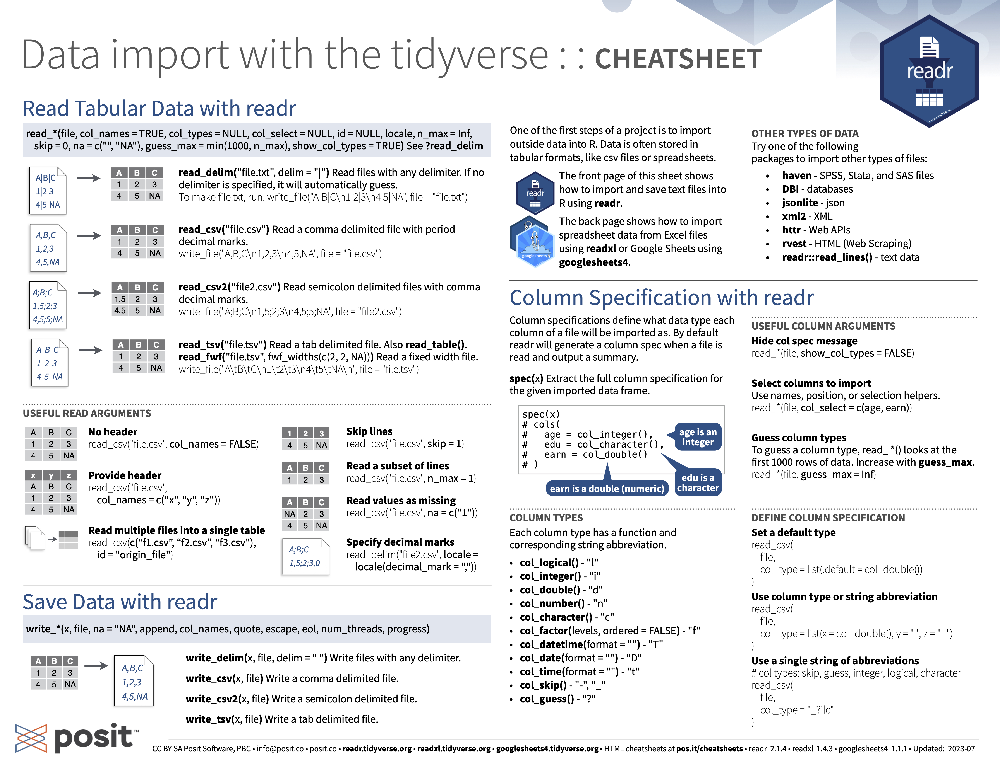

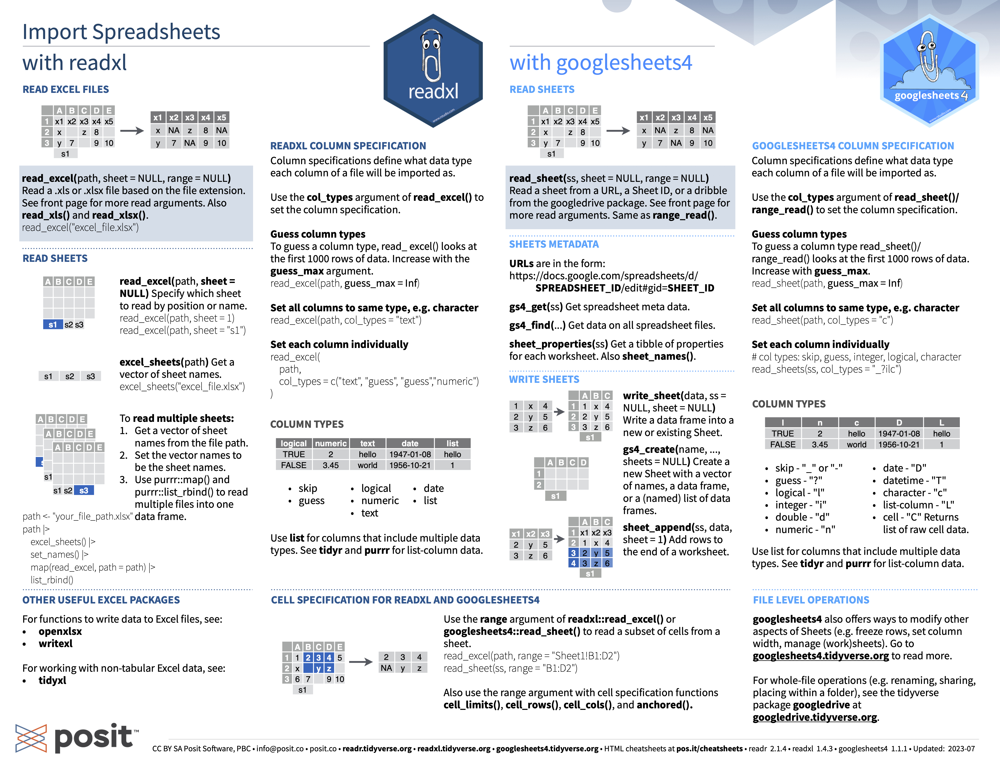

## Weiterführende Ideen

<img src="https://arrow.apache.org/img/arrow-logo_hex_black-txt_white-bg.png" width="100" align=right /> Der Vollständigkeit halber seien an dieser Stelle noch zwei weitere Dateiformate aufgeführt, die praktisch sein können.

1. Das `arrow`-Paket erlaubt es, parquet-Dateien zu lesen und zu schreiben. Diese sind besonders schnell und können ideal zwischen verschiedenen Programmiersprachen verwendet werden (mehr dazu findet sich auf der Webseite von [Apache Parquet](https://parquet.apache.org/).

2. [`write_rds()`](https://readr.tidyverse.org/reference/read_rds.html) und [`read_rds()`](https://readr.tidyverse.org/reference/read_rds.html) sind sogenannte *uniform wrappers*, die Daten direkt in R's eigenem Format `RDS` abspeichern. Das bedeutet, dass man exakt das gleiche Objekt, welches man mit [`write_rds()`](https://readr.tidyverse.org/reference/read_rds.html)gespeichert hat, mit [`read_rds()`](https://readr.tidyverse.org/reference/read_rds.html) wieder laden kann (wenn man `.csv`-Dateien abspeichert gehen z. B. Informationen über den column type verloren).

<img src="https://sfirke.github.io/janitor/reference/figures/logo_small.png" width="100" align=right /> Außerdem ist nochmal das Paket [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0) erwähnenswert, welches allerdings nicht in [`tidyverse`](https://www.tidyverse.org/) enthalten. [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0) hat viele einfache Funktionen, welche das Bereinigen von unsauberen Datensätzen erleichtern – einige von ihnen haben wir ja bereits kennengelernt. Die [Github-Seite](https://sfirke.github.io/janitor/) von [`janitor`](https://www.rdocumentation.org/packages/janitor/versions/2.2.0) enthält einen umfangreichen Teil, wie die Grundfunktionen des Pakets funktionieren.


<div align="center">
    <a href="https://cdn.myportfolio.com/45214904-6a61-4e23-98d6-b140f8654a40/79a12c01-0cc1-4643-b1e7-8ce8cafc947b.png?h=4629f141b6a3b4889b5fca17d1aee45a">
        <img src="https://cdn.myportfolio.com/45214904-6a61-4e23-98d6-b140f8654a40/79a12c01-0cc1-4643-b1e7-8ce8cafc947b.png?h=4629f141b6a3b4889b5fca17d1aee45a" width="50%">
    </a>
</div>

Bildquelle: [@allisonhorst](https://allisonhorst.com/)